# Preparation of the hierarchical negative binomial model

In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
import warnings
from dataclasses import dataclass
from itertools import product
from pathlib import Path
from time import time

import arviz as az
import janitor  # noqa: F401
import matplotlib.pyplot as plt
import nest_asyncio
import numpy as np
import pandas as pd
import plotnine as gg
import pymc3 as pm
import seaborn as sns
import xarray

In [3]:
from speclet.bayesian_models import BayesianModel, get_bayesian_model
from speclet.bayesian_models.hierarchical_nb import HierarchcalNegativeBinomialModel
from speclet.bayesian_models.hierarchical_nb_secondtier import (
    HierarchcalNegativeBinomialSecondTier,
)
from speclet.bayesian_models.negative_binomial import NegativeBinomialModel
from speclet.formatting import print_md
from speclet.io import DataFile, models_dir, project_root
from speclet.managers.cache_manager import (
    PosteriorManager,
    get_cached_posterior,
    get_posterior_cache_name,
)
from speclet.managers.data_managers import CrisprScreenDataManager
from speclet.model_configuration import read_model_configurations
from speclet.modeling.model_fitting_api import fit_pymc3_mcmc, fit_stan_mcmc
from speclet.plot.plotnine_helpers import set_gg_theme
from speclet.project_configuration import (
    get_model_configuration_file,
    read_project_configuration,
)
from speclet.project_enums import ModelFitMethod

In [4]:
notebook_tic = time()

# Configuration for plotting libraries.
set_gg_theme()
%config InlineBackend.figure_format = "retina"

# Scalar constants.
RANDOM_SEED = 847
np.random.seed(RANDOM_SEED)
HDI_PROB = read_project_configuration().modeling.highest_density_interval

In [5]:
MODELS_PAL: dict[str, str] = {
    "simple-nb_STAN_MCMC": "c",
    "simple-nb_PYMC3_MCMC": "dodgerblue",
    "hierarchical-nb_STAN_MCMC": "sandybrown",
    "hierarchical-nb_PYMC3_MCMC": "tomato",
    "hierarchical-nb-second-tier_STAN_MCMC": "lightgreen",
    "hierarchical-nb-second-tier_PYMC3_MCMC": "mediumseagreen",
}

## Data

In [6]:
data_manager = CrisprScreenDataManager(DataFile.DEPMAP_CRC_BONE_SUBSAMPLE)
counts_data = data_manager.get_data()
counts_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,num_mutations,any_deleterious,any_tcga_hotspot,any_cosmic_hotspot,is_mutated,copy_number,lineage,primary_or_metastasis,is_male,age
0,ACGCCACTGACACTCAAGG,LS513_c903R1,0.583209,ERS717283.plasmid,chr1_27006713_-,TENT5B,sanger,True,1,27006713,...,0,NaN,NaN,NaN,False,0.961139,colorectal,primary,True,63.0
1,AGCTGAGCGCAGGGACCGGG,LS513-311Cas9_RepA_p6_batch2,-0.020788,2,chr1_27012633_-,TENT5B,broad,True,1,27012633,...,0,NaN,NaN,NaN,False,0.961139,colorectal,primary,True,63.0
2,CTACTAGACTTCCTGCCGGC,LS513-311Cas9_RepA_p6_batch2,-0.666070,2,chr1_27006754_-,TENT5B,broad,True,1,27006754,...,0,NaN,NaN,NaN,False,0.961139,colorectal,primary,True,63.0
3,AAACTTGCTGACGTGCCTGG,LS513-311Cas9_RepA_p6_batch2,-0.130231,2,chr4_52628042_-,USP46,broad,True,4,52628042,...,0,NaN,NaN,NaN,False,0.952543,colorectal,primary,True,63.0
4,AACAACTAACTTTGTACAT,LS513_c903R1,0.226828,ERS717283.plasmid,chr8_81679130_-,IMPA1,sanger,True,8,81679130,...,0,NaN,NaN,NaN,False,0.957015,colorectal,primary,True,63.0


In [7]:
valid_ct_data = HierarchcalNegativeBinomialSecondTier().data_processing_pipeline(
    counts_data
)
valid_ct_data.head()

,sgrna,replicate_id,lfc,p_dna_batch,genome_alignment,hugo_symbol,screen,multiple_hits_on_gene,sgrna_target_chr,sgrna_target_pos,...,is_mutated,copy_number,lineage,primary_or_metastasis,is_male,age,counts_final_total,counts_initial_total,counts_final_rpm,counts_initial_adj
0,AGCTGAGCGCAGGGACCGGG,LS513-311Cas9_RepA_p6_batch2,-0.020788,2,chr1_27012633_-,TENT5B,broad,True,1,27012633,...,False,0.961139,colorectal,primary,True,63.0,35176093,1.072163e+06,4.837834,142.977169
1,CTACTAGACTTCCTGCCGGC,LS513-311Cas9_RepA_p6_batch2,-0.666070,2,chr1_27006754_-,TENT5B,broad,True,1,27006754,...,False,0.961139,colorectal,primary,True,63.0,35176093,1.072163e+06,6.344539,287.920163
2,AAACTTGCTGACGTGCCTGG,LS513-311Cas9_RepA_p6_batch2,-0.130231,2,chr4_52628042_-,USP46,broad,True,4,52628042,...,False,0.952543,colorectal,primary,True,63.0,35176093,1.072163e+06,7.908101,246.725036
3,AACGATCTCATCCTCAAAAG,LS513-311Cas9_RepA_p6_batch2,0.198958,2,chr11_107549790_+,ALKBH8,broad,True,11,107549790,...,False,0.960147,colorectal,primary,True,63.0,35176093,1.072163e+06,12.570358,311.083872
4,AAGTTCCTCTGAAGTTCGCA,LS513-311Cas9_RepA_p6_batch2,-0.182191,2,chr2_241704672_-,ING5,broad,True,2,241704672,...,False,0.973700,colorectal,primary,True,63.0,35176093,1.072163e+06,9.727518,314.749171


In [8]:
valid_ct_data.shape

(2188, 28)

## Posterior sampling

In [9]:
model_configs = read_model_configurations(
    project_root() / get_model_configuration_file()
)

In [10]:
@dataclass
class ModelPosterior:
    """Information for posterior trace object."""

    id: str
    name: str
    trace: az.InferenceData
    fit_method: ModelFitMethod
    az_regex: list[str]
    sp_model: BayesianModel

In [11]:
traces: dict[str, ModelPosterior] = {}

for model_config in model_configs.configurations:
    for fit_method in model_config.pipelines.fitting:
        id = get_posterior_cache_name(model_config.name, fit_method)
        print(f"loading posterior for '{id}'...")
        traces[id] = ModelPosterior(
            id=id,
            name=model_config.name,
            fit_method=fit_method,
            trace=get_cached_posterior(id, cache_dir=models_dir()),
            sp_model=model_config.model,
            az_regex=get_bayesian_model(model_config.model)().vars_regex(fit_method),
        )

loading posterior for 'simple-nb_STAN_MCMC'...
loading posterior for 'simple-nb_PYMC3_MCMC'...
loading posterior for 'hierarchical-nb_PYMC3_MCMC'...
loading posterior for 'hierarchical-nb_STAN_MCMC'...
loading posterior for 'hierarchical-nb-second-tier_PYMC3_MCMC'...
loading posterior for 'hierarchical-nb-second-tier_STAN_MCMC'...


### 'simple-nb' - STAN_MCMC

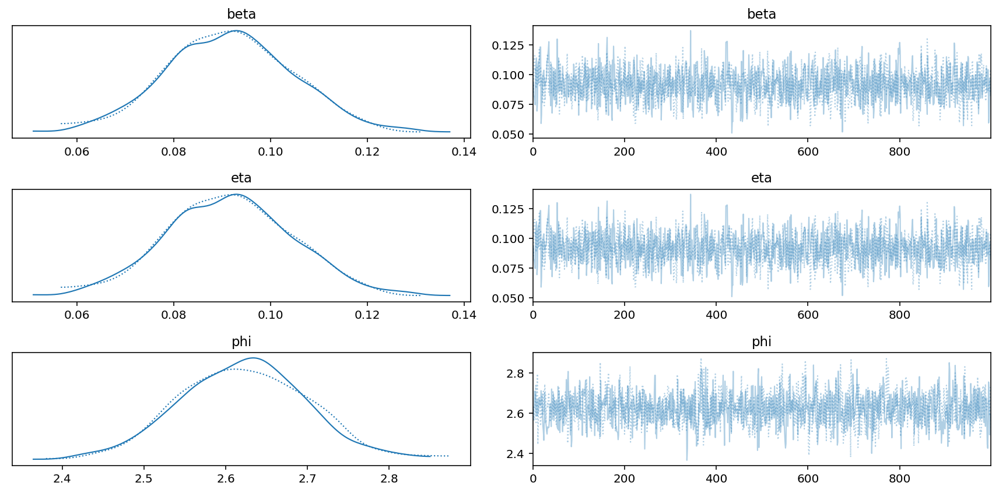

### 'simple-nb' - PYMC3_MCMC

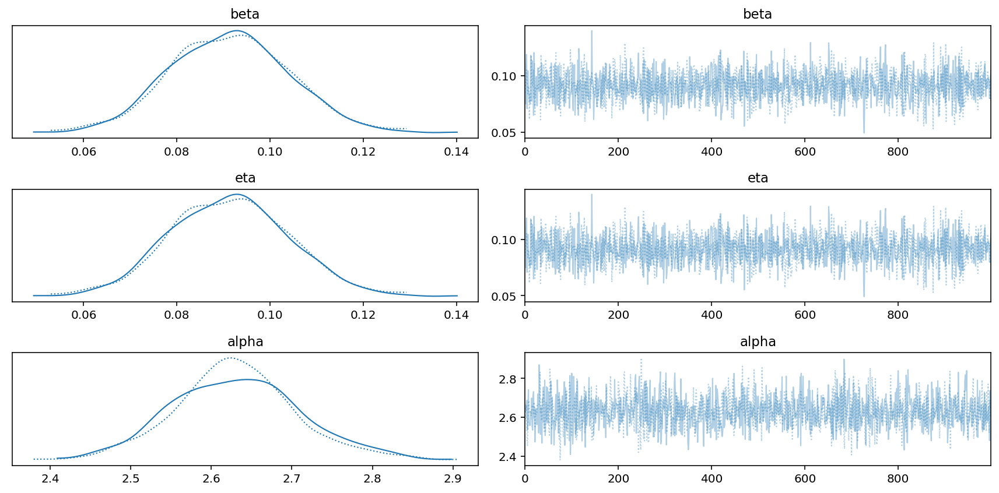

### 'hierarchical-nb' - PYMC3_MCMC

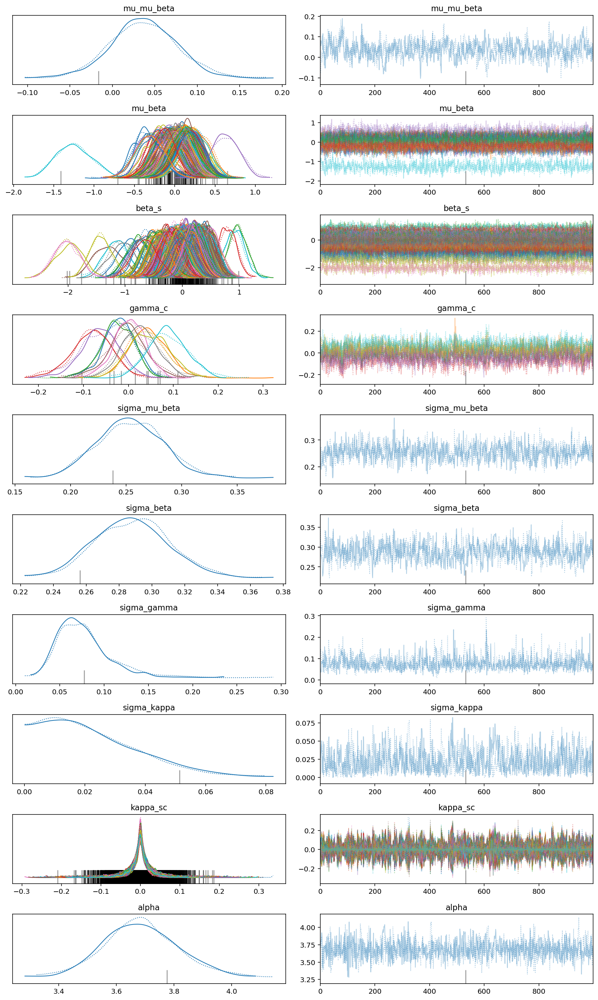

### 'hierarchical-nb' - STAN_MCMC

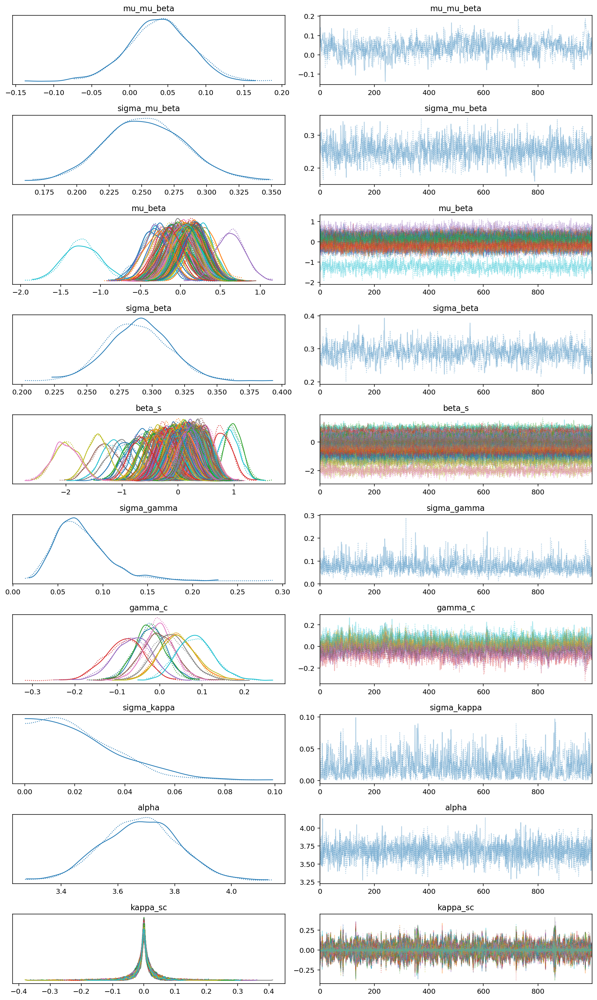

### 'hierarchical-nb-second-tier' - PYMC3_MCMC

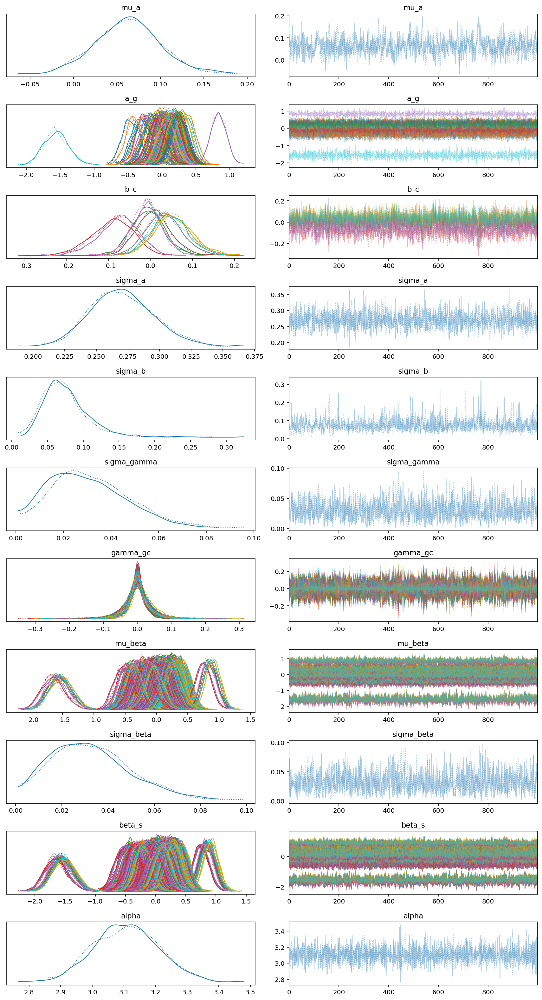

### 'hierarchical-nb-second-tier' - STAN_MCMC

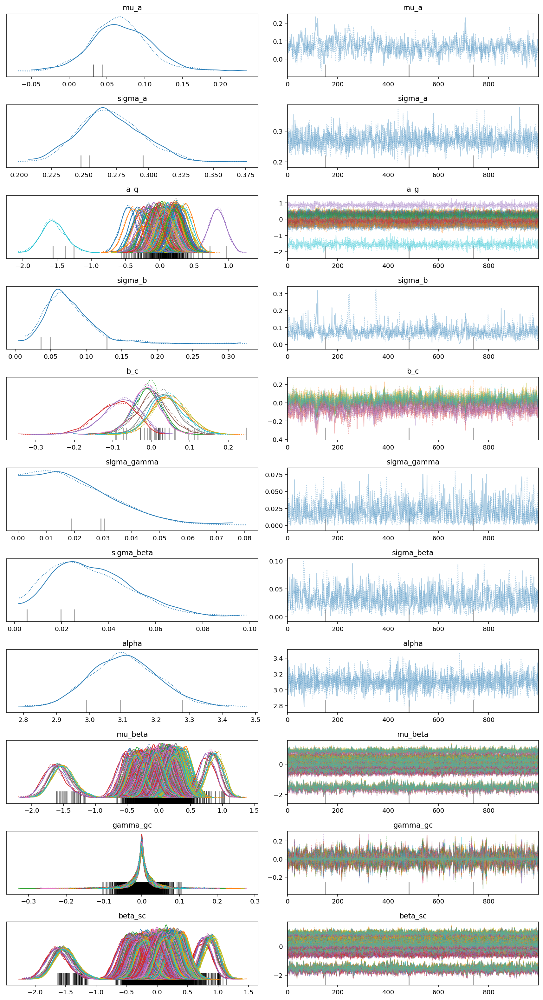

In [12]:
for trace_data in traces.values():
    print_md(f"### '{trace_data.name}' - {trace_data.fit_method.value}")
    az.plot_trace(trace_data.trace, var_names=trace_data.az_regex, filter_vars="regex")
    plt.tight_layout()
    plt.show()

In [13]:
N_DRAWS = 1000
N_CHAINS = 2
N_DATA = valid_ct_data.shape[0]
SIZE = 10

ppc_idx = np.random.choice(np.arange(0, N_DRAWS * N_CHAINS), size=SIZE, replace=False)

In [14]:
def _get_ppc(trace: az.InferenceData) -> xarray.DataArray:
    for ppc_name in ["y_hat", "ct_final"]:
        ppc = trace.posterior_predictive.get(ppc_name)
        if ppc is not None:
            return ppc
    print(trace)
    raise BaseException("Unable to find PPC array.")

In [15]:
model_ppc_averages = pd.DataFrame()
model_ppc_examples = pd.DataFrame()

for trace_data in traces.values():
    ppc = _get_ppc(trace_data.trace)
    ppc_ary = ppc.values.reshape(-1, N_DATA)

    ppc_avg = ppc_ary.mean(0)
    ppc_samples = ppc_ary[ppc_idx, :]

    model_ppc_average = pd.DataFrame(
        {"model": np.repeat(trace_data.id, len(ppc_avg)), "value": ppc_avg}
    )
    model_ppc_averages = pd.concat([model_ppc_averages, model_ppc_average])

    model_ppc_example = (
        pd.DataFrame(ppc_samples.T)
        .reset_index()
        .pivot_longer(index="index", names_to="draw")
        .drop(columns=["index"])
        .assign(model=trace_data.id)
    )
    model_ppc_examples = pd.concat([model_ppc_examples, model_ppc_example])

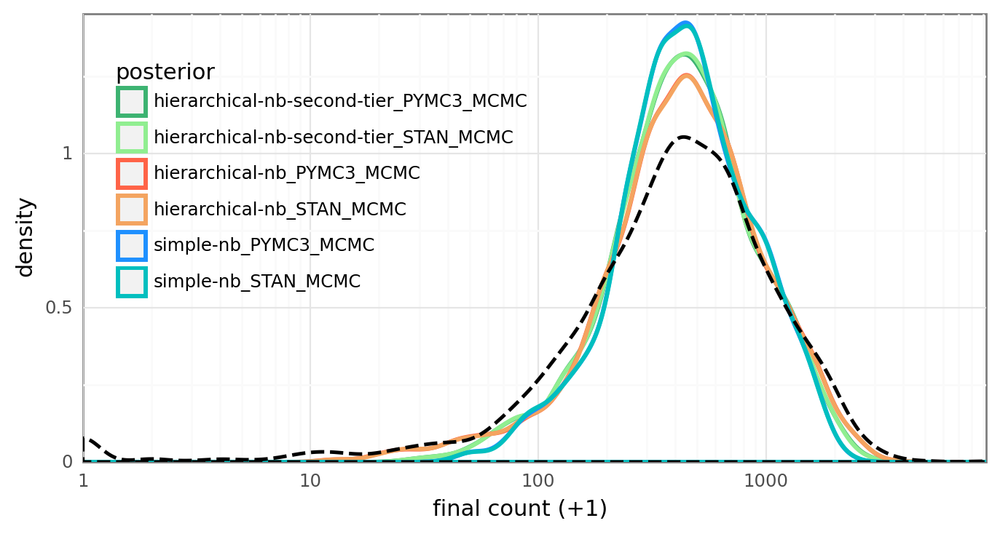

<ggplot: (392807153)>

In [16]:
(
    gg.ggplot(model_ppc_averages, gg.aes(x="value+1"))
    + gg.geom_density(gg.aes(color="model"), size=1.2)
    + gg.geom_density(
        gg.aes(x="counts_final+1"),
        data=valid_ct_data,
        color="black",
        size=1,
        linetype="--",
    )
    + gg.scale_x_log10(expand=(0, 0))
    + gg.scale_y_continuous(expand=(0, 0, 0.02, 0))
    + gg.scale_color_manual(values=MODELS_PAL)
    + gg.theme(
        figure_size=(8, 4),
        legend_position=(0.33, 0.6),
        legend_background=gg.element_blank(),
    )
    + gg.labs(x="final count (+1)", color="posterior")
)

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/plotnine/layer.py:324: PlotnineWarning: stat_bin : Removed 6 rows containing non-finite values.
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/plotnine/layer.py:324: PlotnineWarning: stat_bin : Removed 42 rows containing non-finite values.
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_histogram : Removed 12 rows containing missing values.


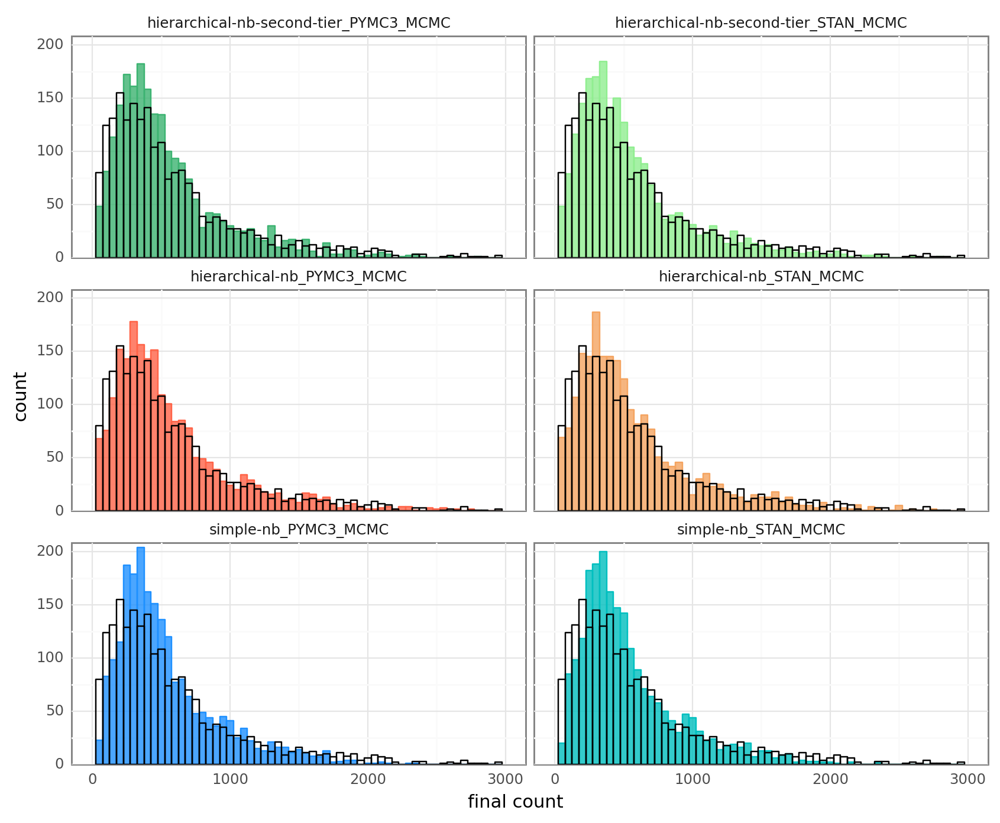

<ggplot: (392279790)>

In [17]:
_binwidth = 50
(
    gg.ggplot(model_ppc_averages, gg.aes(x="value"))
    + gg.facet_wrap("~model", ncol=2)
    + gg.geom_histogram(
        gg.aes(fill="model", color="model"),
        alpha=0.8,
        binwidth=_binwidth,
        position="identity",
    )
    + gg.geom_histogram(
        gg.aes(x="counts_final"),
        data=valid_ct_data,
        color="black",
        alpha=0,
        binwidth=_binwidth,
    )
    + gg.scale_x_continuous(limits=(0, 3000))
    + gg.scale_y_continuous(expand=(0, 0, 0.02, 0))
    + gg.scale_color_manual(values=MODELS_PAL)
    + gg.scale_fill_manual(values=MODELS_PAL)
    + gg.theme(
        figure_size=(10, 8),
        legend_position="none",
        legend_background=gg.element_blank(),
    )
    + gg.labs(x="final count", color="posterior")
)

In [18]:
ppc_zeros = pd.DataFrame()

for trace_data in traces.values():
    ppc = _get_ppc(trace_data.trace)
    ppc_ary = ppc.values.reshape(-1, N_DATA)
    frac_0 = (ppc_ary == 0).mean(1)
    _df = pd.DataFrame({"frac_zero": frac_0}).assign(model=trace_data.id)
    ppc_zeros = pd.concat([ppc_zeros, _df])

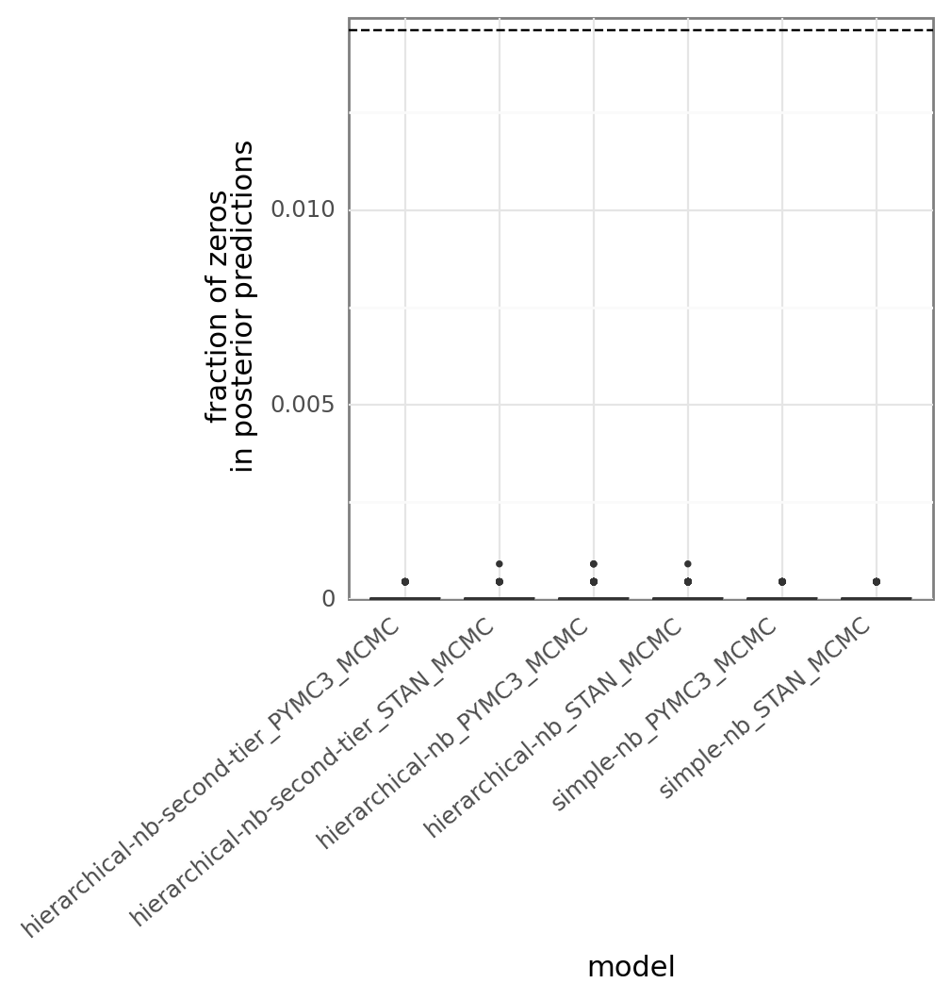

<ggplot: (392516334)>

In [19]:
obs_frac_0 = (valid_ct_data.counts_final == 0).mean()
(
    gg.ggplot(ppc_zeros, gg.aes(x="model", y="frac_zero"))
    + gg.geom_boxplot(outlier_size=0.5)
    + gg.geom_hline(yintercept=obs_frac_0, linetype="--")
    + gg.scale_y_continuous(expand=(0, 0, 0.02, 0))
    + gg.theme(axis_text_x=gg.element_text(angle=40, hjust=1))
    + gg.labs(y="fraction of zeros\nin posterior predictions")
)

In [20]:
ppc_zeros.groupby("model").agg(["mean", "min", "max", "std"]).assign(obs=obs_frac_0)

frac_zero                           \
                                            mean  min       max       std   
model                                                                       
hierarchical-nb-second-tier_PYMC3_MCMC  0.000007  0.0  0.000457  0.000056   
hierarchical-nb-second-tier_STAN_MCMC   0.000005  0.0  0.000914  0.000050   
hierarchical-nb_PYMC3_MCMC              0.000020  0.0  0.000914  0.000097   
hierarchical-nb_STAN_MCMC               0.000026  0.0  0.000914  0.000107   
simple-nb_PYMC3_MCMC                    0.000011  0.0  0.000457  0.000069   
simple-nb_STAN_MCMC                     0.000011  0.0  0.000457  0.000069   

                                             obs  
                                                  
model                                             
hierarchical-nb-second-tier_PYMC3_MCMC  0.014625  
hierarchical-nb-second-tier_STAN_MCMC   0.014625  
hierarchical-nb_PYMC3_MCMC              0.014625  
hierarchical-nb_STAN_MCMC               0.014625  
simple-nb_PYMC3_MCMC                    0.014625  
simple-nb_STAN_MCMC                     0.014625

In [21]:
model_comparison = az.compare({id: m.trace for id, m in traces.items()})
model_comparison

/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.
/usr/local/Caskroom/miniconda/base/envs/speclet/lib/python3.9/site-packages/arviz/stats/stats.py:694: UserWarning: Estimated shape parameter of Pareto distribution is greater than 0.7 for one or more samples. You should consider using a more robust model, this is because importance sampling is less likely to work well if the marginal posterior and LOO posterior are very different. This is more likely to happen with a non-robust model and highly influential observations.


,rank,loo,p_loo,d_loo,weight,se,dse,warning,loo_scale
hierarchical-nb_PYMC3_MCMC,0,-14835.915584,212.205964,0.000000,0.929448,53.028177,0.000000,True,log
hierarchical-nb_STAN_MCMC,1,-14839.356659,215.206448,3.441075,0.000000,53.029897,1.127979,True,log
hierarchical-nb-second-tier_PYMC3_MCMC,2,-14945.116112,89.207308,109.200528,0.009158,50.567357,16.425525,False,log
hierarchical-nb-second-tier_STAN_MCMC,3,-14945.145696,87.079018,109.230112,0.000000,50.589589,16.387747,False,log
simple-nb_PYMC3_MCMC,4,-15080.507641,4.270657,244.592057,0.000000,54.726429,27.256310,False,log
simple-nb_STAN_MCMC,5,-15080.611143,4.393212,244.695559,0.061395,54.597832,27.199667,False,log


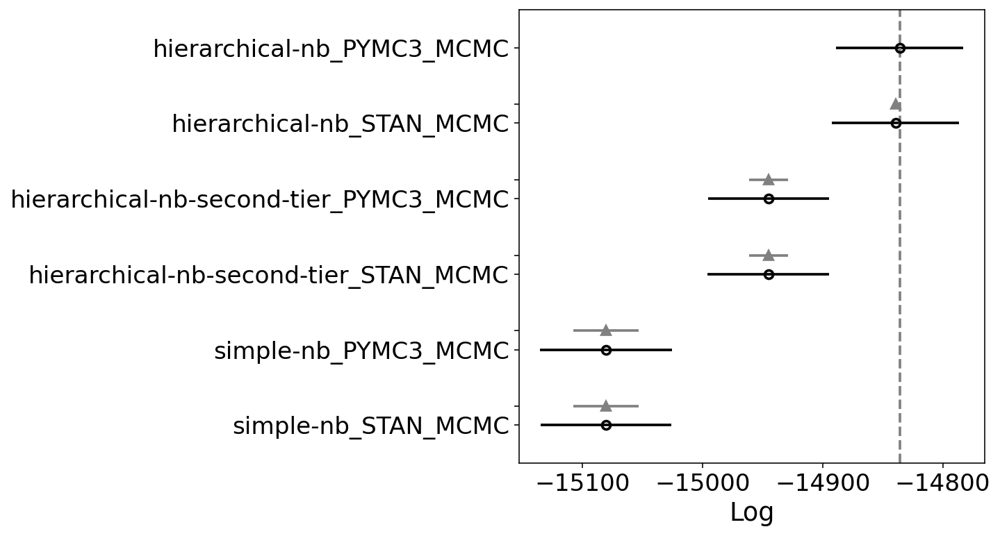

In [22]:
az.plot_compare(model_comparison, insample_dev=False);

---

In [23]:
notebook_toc = time()
print(f"execution time: {(notebook_toc - notebook_tic) / 60:.2f} minutes")

execution time: 27.86 minutes


In [24]:
%load_ext watermark
%watermark -d -u -v -iv -b -h -m

Last updated: 2022-01-24

Python implementation: CPython
Python version       : 3.9.9
IPython version      : 8.0.0

Compiler    : Clang 11.1.0 
OS          : Darwin
Release     : 21.2.0
Machine     : x86_64
Processor   : i386
CPU cores   : 4
Architecture: 64bit

Hostname: JHCookMac

Git branch: nb-model

janitor     : 0.22.0
matplotlib  : 3.5.1
xarray      : 0.20.2
seaborn     : 0.11.2
arviz       : 0.11.4
nest_asyncio: 1.5.4
numpy       : 1.22.0
pymc3       : 3.11.4
pandas      : 1.3.5
plotnine    : 0.8.0

